# Importation

In [1]:
import io

import healpy as hp
import matplotlib.pyplot as plt
import numpy as np
import yaml
from IPython.display import Image as IPyImage
from PIL import Image
from pyoperators import (
    MPI,
    BlockColumnOperator,
    Operator,
    flags,
)
from pysimulators.interfaces.healpy import (
    Spherical2HealpixOperator,
)

import qubic
from qubic.lib.MapMaking.Qatmosphere import AtmosphereMaps, WindPerturbation
from qubic.lib.Qsamplings import QubicSampling, equ2gal, get_pointing

comm = MPI.COMM_WORLD
rank = comm.Get_rank()

%matplotlib inline

ImportError: cannot import name '_flib' from 'qubic' (/home/laclavere/qubic/qubic/__init__.py)

In [ ]:
# Import simulation parameters
with open("params.yml", "r") as file:
    params = yaml.safe_load(file)

np.random.seed(params["seed"])

In [ ]:
# Call the class which build the atmosphere maps
atm = AtmosphereMaps(params)
qubic_dict = atm.qubic_dict
qubic_dict["instrument_type"] = "UWB"
qubic_dict["interp_projection"] = False

npix = hp.nside2npix(params["nside"])

center = np.array([0, -57])
qubic_patch = qubic.lib.Qsamplings.equ2gal(center[0], center[1])

/home/laclavere/qubic/qubic/lib/MapMaking/Qatmosphere.py:696: RuntimeWarning: invalid value encountered in multiply
  2 ** (2 / 3) / sp.gamma(1 / 3) * (r / r0) ** (1 / 3) * sp.kv(1 / 3, r / r0),
/home/laclavere/qubic/qubic/lib/MapMaking/Qatmosphere.py:862: RuntimeWarning: divide by zero encountered in divide
  dl2cl_factor = 2 * np.pi / (ell * (ell + 1))


# Mixing Matrix

(8, 2)


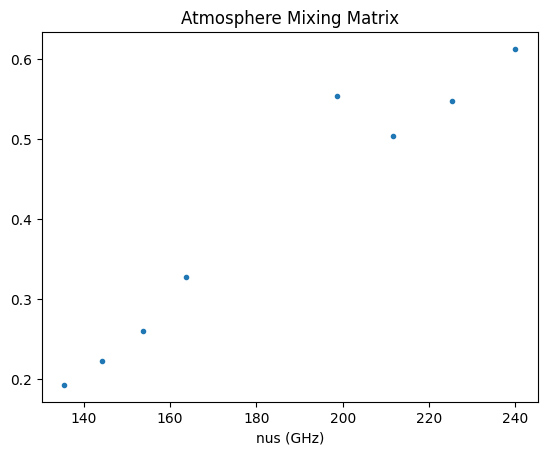

In [ ]:
mixing_matrix = np.ones((params["nsub_in"], 2))
# Atm mixing matrix
mixing_matrix[:, 1] = atm.temperature * atm.integrated_abs_spectrum * atm.mean_water_vapor_density
print(mixing_matrix.shape)

plt.plot(atm.frequencies, mixing_matrix[:, 1], ".")
plt.xlabel("nus (GHz)")
plt.title("Atmosphere Mixing Matrix")
plt.show()

# Scanning Strategy

In [ ]:
### Random pointing
qubic_dict["random_pointing"] = True
qubic_dict["date_obs"] = "2023-10-01 22:57:00.000"
qubic_dict["period"] = 3
qubic_dict["fix_azimuth"]["apply"] = False

### Sweeping pointing
if params["sweeping_pointings"]:
    qubic_dict["random_pointing"] = False
    qubic_dict["sweeping_pointing"] = True

    qubic_dict["angspeed"] = 0.1
    qubic_dict["delta_az"] = 20
    qubic_dict["nsweeps_per_elevation"] = 1
    qubic_dict["duration"] = 1
    # npointings = 3600 * qubic_dict['duration'] / qubic_dict['period']
    qubic_dict["period"] = 3600 * qubic_dict["duration"] / params["npointings"]

### Repeat pointing
# qubic_dict["repeat_pointing"] = False

### Build scanning strategy instance
q_sampling_gal = get_pointing(qubic_dict)
qubic_patch = np.array([0, -57])
center_gal = equ2gal(qubic_patch[0], qubic_patch[1])
center_local = np.array([np.mean(q_sampling_gal.azimuth), np.mean(q_sampling_gal.elevation)])

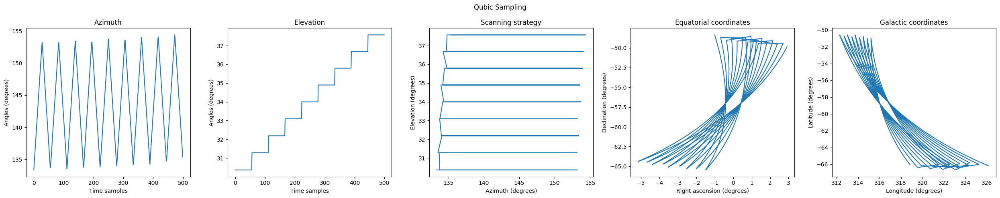

In [ ]:
### Plot scanning strategy
az, el = q_sampling_gal.azimuth, q_sampling_gal.elevation

fig, axs = plt.subplots(1, 5, figsize=(25, 5))

# Azimuth plot
axs[0].plot(az)
axs[0].set_title("Azimuth")
axs[0].set_xlabel("Time samples")
axs[0].set_ylabel("Angles (degrees)")

# Elevation plot
axs[1].plot(el)
axs[1].set_title("Elevation")
axs[1].set_xlabel("Time samples")
axs[1].set_ylabel("Angles (degrees)")

# Scanning strategy plot
axs[2].plot(az, el)
axs[2].set_title("Scanning strategy")
axs[2].set_xlabel("Azimuth (degrees)")
axs[2].set_ylabel("Elevation (degrees)")

# Equatorial coordinates plot
axs[3].plot((q_sampling_gal.equatorial[:, 0] + 180) % 360 - 180, q_sampling_gal.equatorial[:, 1])
axs[3].set_title("Equatorial coordinates")
axs[3].set_xlabel("Right ascension (degrees)")
axs[3].set_ylabel("Declination (degrees)")

# Galactic coordinates plot
axs[4].plot(q_sampling_gal.galactic[:, 0], q_sampling_gal.galactic[:, 1])
axs[4].set_title("Galactic coordinates")
axs[4].set_xlabel("Longitude (degrees)")
axs[4].set_ylabel("Latitude (degrees)")

fig.suptitle("Qubic Sampling")
plt.tight_layout()
plt.show()

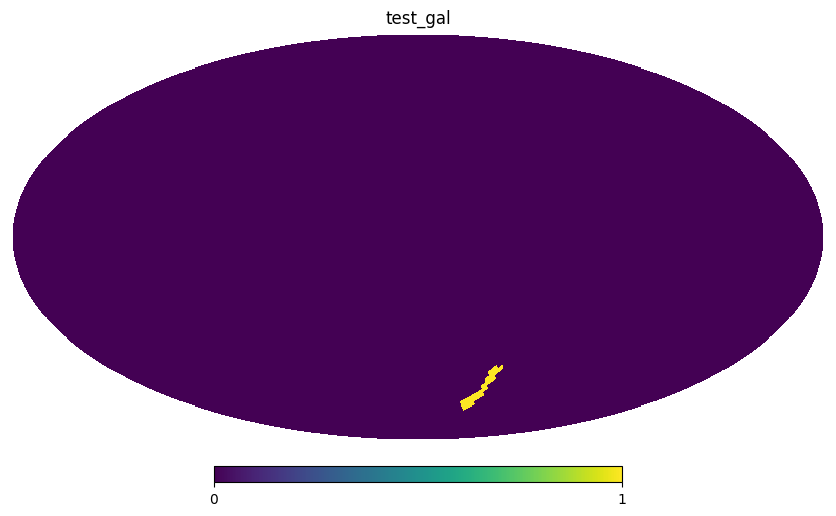

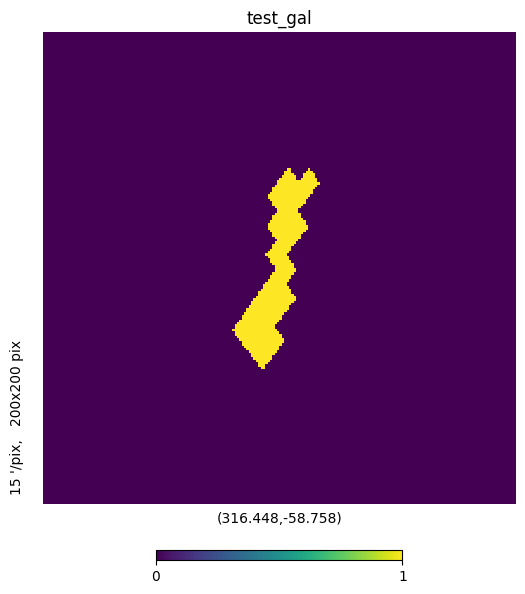

In [ ]:
### Test scanning strategy plots
test_gal = np.zeros(hp.nside2npix(params["nside"]))

index = np.array(
    Spherical2HealpixOperator(params["nside"], "azimuth, elevation")(
        np.radians(q_sampling_gal.galactic)
    ),
    dtype="int",
)
test_gal[index] = 1
hp.mollview(test_gal, title="test_gal", cmap="viridis")
hp.gnomview(test_gal, title="test_gal", cmap="viridis", reso=15, rot=center_gal)

## Build local sampling

In [ ]:
### Define scanning strategy for atm observation
q_sampling_local_rec = QubicSampling(
    q_sampling_gal.index.size,
    date_obs=qubic_dict["date_obs"],
    period=qubic_dict["period"],
    latitude=qubic_dict["latitude"],
    longitude=qubic_dict["longitude"],
)

q_sampling_local_rec.azimuth = q_sampling_gal.azimuth
q_sampling_local_rec.elevation = q_sampling_gal.elevation
q_sampling_local_rec.pitch = q_sampling_gal.pitch
q_sampling_local_rec.angle_hwp = q_sampling_gal.angle_hwp

q_sampling_local_rec.fix_az = True

if params["wind"]:
    wind_class = WindPerturbation(params, q_sampling_gal)
    q_sampling_local = wind_class.get_deviated_qubic_sampling()
else:
    q_sampling_local = q_sampling_local_rec

143.80975773846924 5.275273725424069


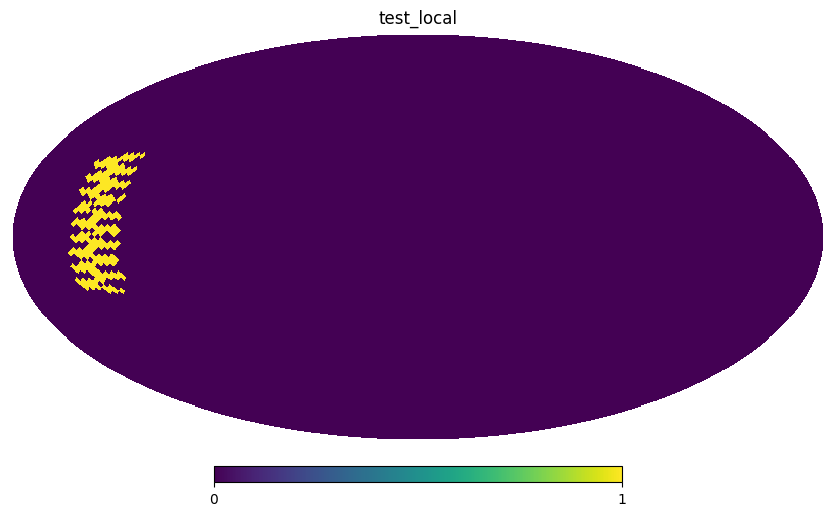

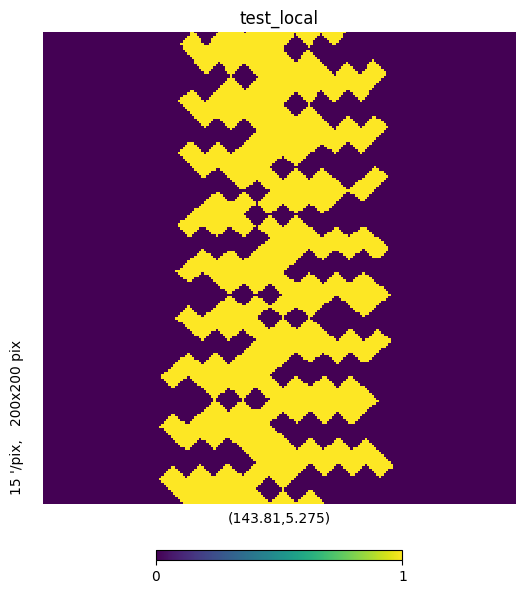

In [ ]:
test_local = np.zeros(hp.nside2npix(params["nside"]))

index = np.array(
    Spherical2HealpixOperator(params["nside"], "azimuth, elevation")(
        np.radians([q_sampling_local.azimuth, q_sampling_local.elevation]).T
    ),
    dtype="int",
)
test_local[index] = 1
hp.mollview(test_local, title="test_local", cmap="viridis")
hp.gnomview(
    test_local,
    title="test_local",
    cmap="viridis",
    reso=15,
    rot=(np.mean(q_sampling_local.azimuth), np.mean(q_sampling_local.elevation)),
)

print(np.mean(q_sampling_local.azimuth), np.mean(q_sampling_local.elevation))

143.80975773846924 5.275273725424069


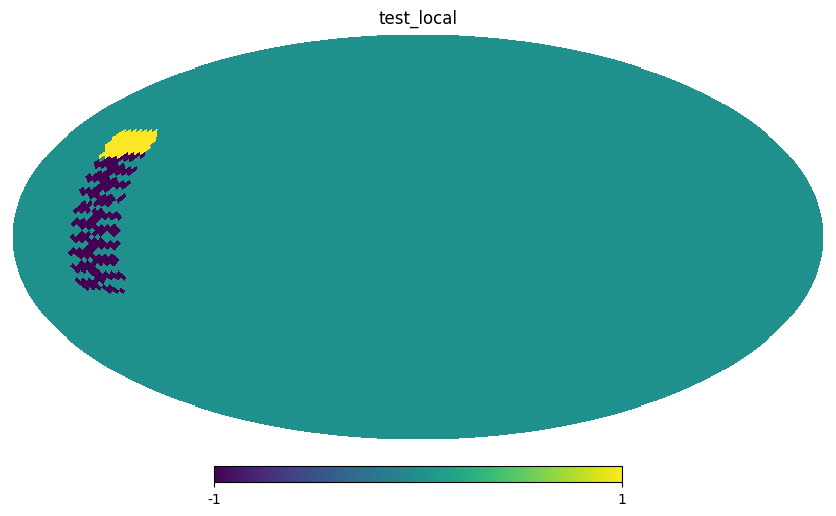

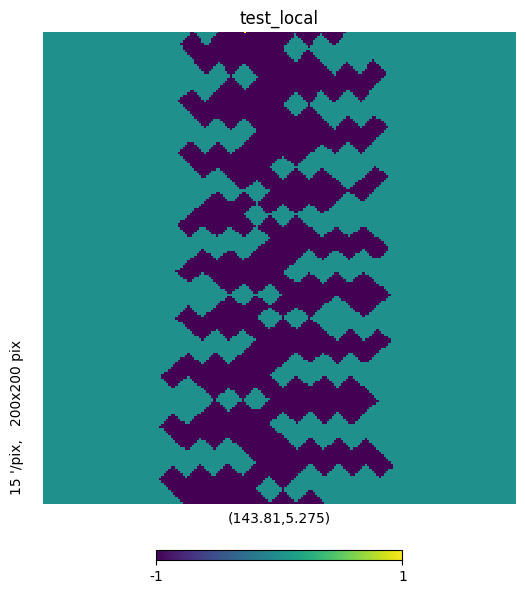

In [ ]:
test_local = np.zeros(hp.nside2npix(params["nside"]))

index = np.array(
    Spherical2HealpixOperator(params["nside"], "azimuth, elevation")(
        np.radians([q_sampling_local_rec.azimuth, q_sampling_local_rec.elevation]).T
    ),
    dtype="int",
)
index_deviated = np.array(
    Spherical2HealpixOperator(params["nside"], "azimuth, elevation")(
        np.radians([q_sampling_local.azimuth, q_sampling_local.elevation]).T
    ),
    dtype="int",
)
test_local[index] = 1
test_local[index_deviated] = -1
hp.mollview(test_local, title="test_local", cmap="viridis")
hp.gnomview(
    test_local,
    title="test_local",
    cmap="viridis",
    reso=15,
    rot=(np.mean(q_sampling_local.azimuth), np.mean(q_sampling_local.elevation)),
)

print(np.mean(q_sampling_local.azimuth), np.mean(q_sampling_local.elevation))

# Build 1 pointing sampling list

In [ ]:
q_sampling = []

N_buffer = 10

for ipointing in range(int(params["npointings"] / N_buffer)):
    tmp = QubicSampling(N_buffer)
    tmp.azimuth = q_sampling_gal.azimuth[ipointing * N_buffer : (ipointing + 1) * N_buffer]
    tmp.elevation = q_sampling_gal.elevation[ipointing * N_buffer : (ipointing + 1) * N_buffer]
    tmp.pitch = q_sampling_gal.pitch[ipointing * N_buffer : (ipointing + 1) * N_buffer]
    tmp.angle_hwp = q_sampling_gal.angle_hwp[ipointing * N_buffer : (ipointing + 1) * N_buffer]
    tmp.fix_az = True
    q_sampling.append(tmp)

# Atm

(8, 12288, 3)


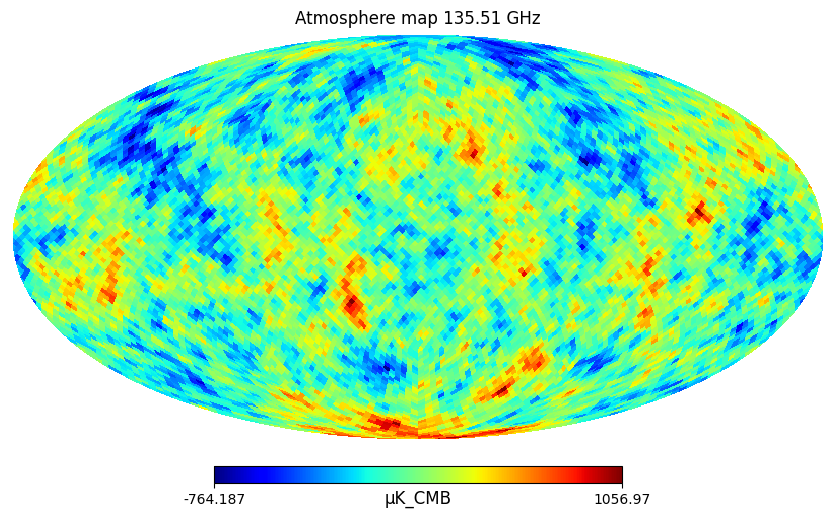

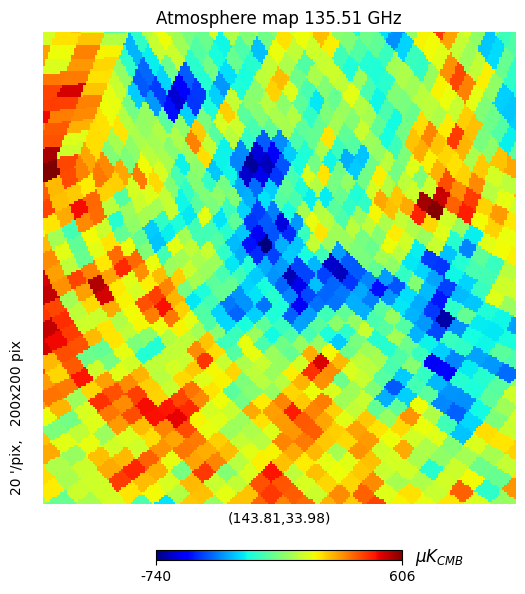

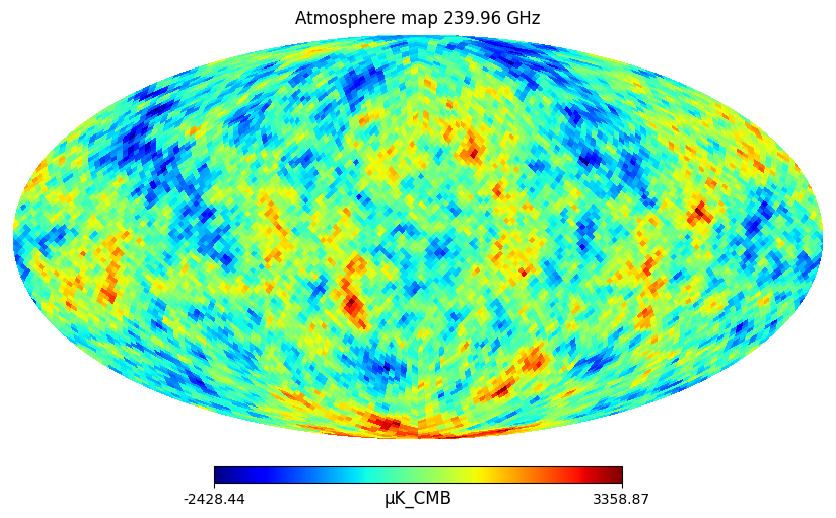

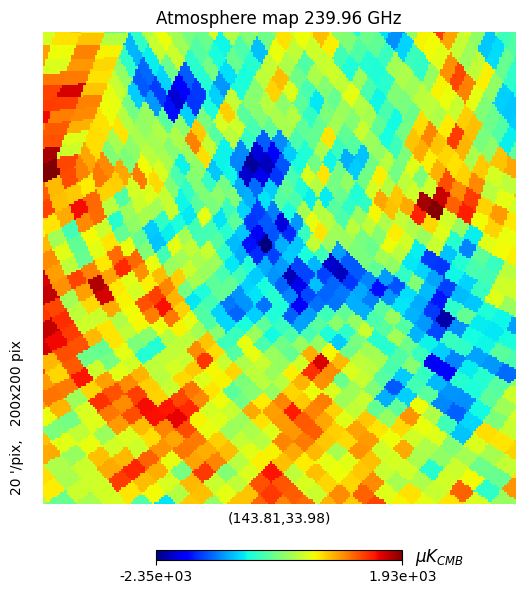

In [ ]:
atm_maps = np.zeros((params["nsub_in"], hp.nside2npix(params["nside"]), 3))
atm_maps[..., 0] = atm.get_temp_maps(atm.delta_rho_map) / 1e3
print(atm_maps.shape)

index_nu = 0
hp.mollview(
    atm_maps[index_nu, :, 0],
    cmap="jet",
    unit="µK_CMB",
    title="Atmosphere map {:.2f} GHz".format(atm.frequencies[index_nu]),
)
hp.gnomview(
    atm_maps[index_nu, :, 0],
    rot=center_local,
    reso=20,
    title="Atmosphere map {:.2f} GHz".format(atm.frequencies[index_nu]),
    unit=r"$µK_{CMB}$",
    cmap="jet",
)

index_nu = -1
hp.mollview(
    atm_maps[index_nu, :, 0],
    cmap="jet",
    unit="µK_CMB",
    title="Atmosphere map {:.2f} GHz".format(atm.frequencies[index_nu]),
)
hp.gnomview(
    atm_maps[index_nu, :, 0],
    rot=center_local,
    reso=20,
    title="Atmosphere map {:.2f} GHz".format(atm.frequencies[index_nu]),
    unit=r"$µK_{CMB}$",
    cmap="jet",
)

In [ ]:
true_maps = atm_maps.mean(axis=0)[None]
print(true_maps.shape)

min_input = np.min(true_maps, axis=1)
max_input = np.max(true_maps, axis=1)

max = np.max([min_input, max_input], axis=0)
min_input = -max
max_input = max

(1, 12288, 3)


# Test Wind Operator

In [ ]:
def shift_healpy_map(
    m,
    wx,
    wy,
    nest=False,
    time_delta=1.0,
    atm_altitude=1000.0,
    verbose=False,
):
    """
    Advect a HEALPix map using a horizontal wind field (wx, wy).

    Parameters
    ----------
    m : array
        Healpy map (npix,) or (nfreq, npix) or (nfreq, npix, nstokes)
    wx, wy : float
        Wind components in m/s (east, north)
    time_delta : float
        Time step in seconds
    atm_altitude : float
        Effective altitude (m) converting linear → angular displacement
    """

    m = np.asarray(m)

    # --- Shape handling ---
    if m.ndim == 1:
        m_work = m[np.newaxis, :, np.newaxis]
        squeeze = (0, 2)
    elif m.ndim == 2:
        m_work = m[np.newaxis, :, :]
        squeeze = (0,)
    elif m.ndim == 3:
        m_work = m
        squeeze = ()
    else:
        raise ValueError(f"Unsupported shape {m.shape}")

    nfreq, npix, nstokes = m_work.shape
    nside = hp.npix2nside(npix)
    dx_rad = (wx * time_delta) / atm_altitude
    dy_rad = (wy * time_delta) / atm_altitude

    if np.hypot(dx_rad, dy_rad) < 1e-6:
        return m.copy()

    pix = np.arange(npix)
    theta, phi = hp.pix2ang(nside, pix, nest=nest)

    new_theta, new_phi = wind_class.apply_wind_displacement(
        theta, phi, dx_rad, dy_rad, direction='backward'
    )

    # --- Interpolation ---
    m_shifted = np.empty_like(m_work)
    for f in range(nfreq):
        for s in range(nstokes):
            m_shifted[f, :, s] = hp.get_interp_val(
                m_work[f, :, s],
                new_theta,
                new_phi,
                nest=nest,
            )

    if squeeze:
        m_shifted = m_shifted.squeeze(axis=squeeze)

    return m_shifted

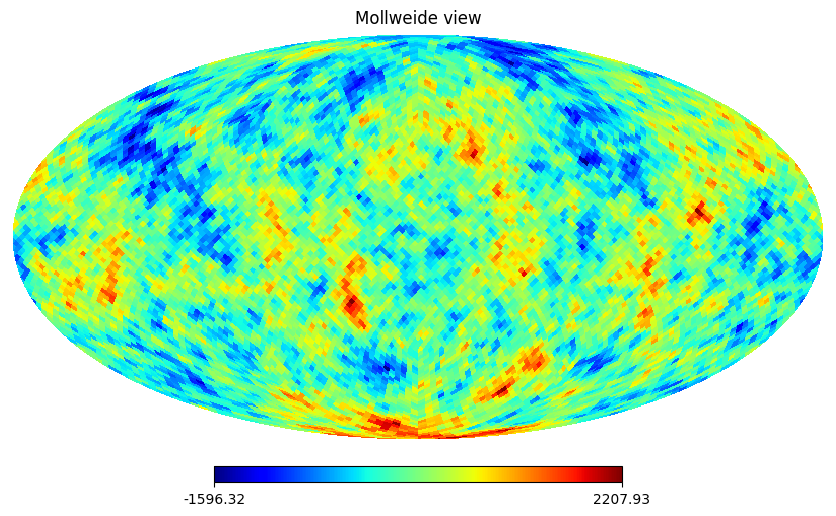

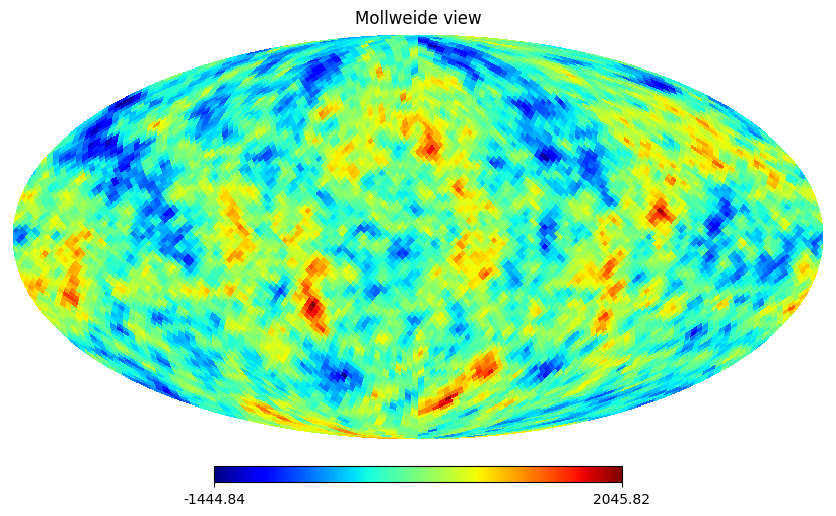

In [ ]:
hp.mollview(true_maps[0, :, 0], cmap="jet")
hp.mollview(shift_healpy_map(true_maps[0, : , 0], 300, 0, verbose=True), cmap="jet")

In [ ]:
@flags.square
class ShiftOperator(Operator):
    """
    PyOperator wrapping rotate_healpy_map_by_wind.
    Applies a sky rotation defined by a 2D wind vector (wx, wy).
    """

    def __init__(self, wind, dtype=None, **keywords):
        # Always call parent __init__ first in PyOperators subclasses
        Operator.__init__(self, dtype=dtype, **keywords)
        self.wind = np.asarray(wind, dtype=float)  # (wx, wy)

    def direct(self, input_map, out):
        wind_x, wind_y = self.wind
        m_rot = shift_healpy_map(input_map, wind_x, wind_y, verbose=False)  # unpack tuple
        out[...] = m_rot

    def transpose(self, input_map, out):
        wind_x, wind_y = self.wind
        m_rot = shift_healpy_map(input_map, -wind_x, -wind_y, verbose=False)
        out[...] = m_rot


def get_wind_operator(wind, Npointings=params["npointings"], Nsub=params["nsub_rec"], N_buffer=N_buffer, nside=params["nside"]):
    npix = hp.nside2npix(nside)
    shape = (Nsub, npix, 3)
    wind_x, wind_y = wind
    chunks = range(0, Npointings, N_buffer)

    tmp = []
    for i in chunks:
        wx_chunk = float(np.mean(wind_x[i : i + N_buffer]))
        wy_chunk = float(np.mean(wind_y[i : i + N_buffer]))

        tmp.append(
            ShiftOperator(
                wind=(wx_chunk, wy_chunk),
                shapein=shape,
                shapeout=shape,
            )
        )

    return BlockColumnOperator(tmp, axisout=0)


# Expected output shape: (n_chunks * nsub_rec, npix, 3)
n_chunks = len(range(0, params["npointings"], N_buffer))
print("Expected output shape:", (n_chunks * params["nsub_rec"], npix, 3))

shift = get_wind_operator(wind_class.get_wind(), Npointings=params["npointings"], Nsub=1)

print("shift:", shift.shapein, "→", shift.shapeout)

Expected output shape: (400, 12288, 3)
shift: (1, 12288, 3) → (50, 12288, 3)


/home/laclavere/miniforge3/envs/venv-qubic/lib/python3.10/site-packages/healpy/visufunc.py:223: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  f = pylab.figure(fig, figsize=(8.5, 5.4))


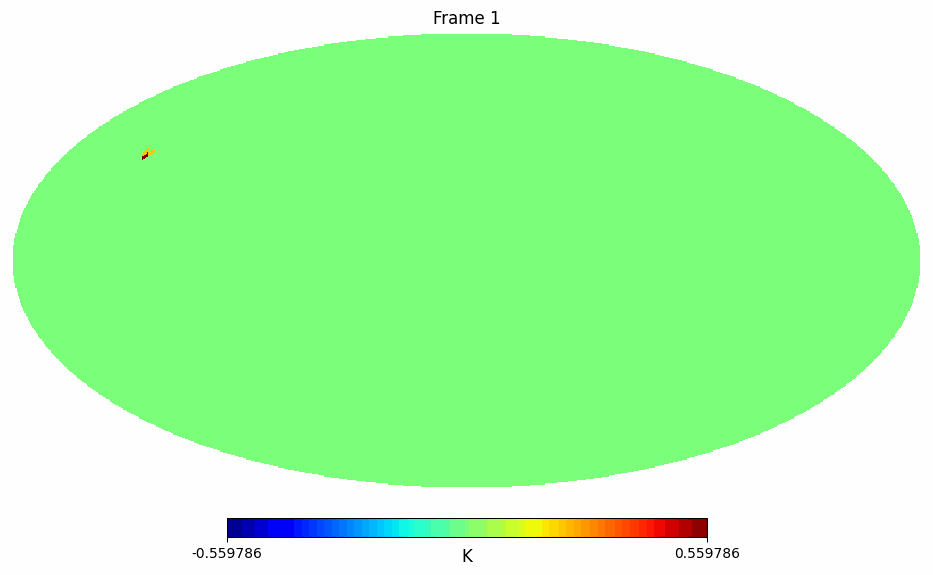

In [ ]:
def create_mollview_gif(maps, duration=100):
    """
    Create a GIF from a sequence of HEALPix maps and display it inline (no file saved).

    Parameters:
    -----------
    maps : list of np.ndarray
        List of HEALPix maps to animate.
    duration : int
        Time between frames in milliseconds.

    Returns:
    --------
    IPython.display.Image object (displays automatically in notebook)
    """
    frames = []
    range = np.max([-np.min(maps[0]), np.max(maps[0])])
    
    for i, m in enumerate(maps):
        fig = plt.figure(figsize=(10, 6))
        hp.mollview(
            m, fig=fig, title=f"Frame {i + 1}", unit="K", cmap="jet",
            min = -range, max=range
        )

        buf = io.BytesIO()
        plt.savefig(buf, format="png", dpi=100, bbox_inches="tight")
        buf.seek(0)
        frames.append(Image.open(buf))
        plt.close(fig)

    # Save to an in-memory bytes buffer
    gif_buffer = io.BytesIO()
    frames[0].save(
        gif_buffer,
        save_all=True,
        append_images=frames[1:],
        duration=duration,
        loop=0,
        optimize=True,
        format="GIF",
    )
    gif_buffer.seek(0)

    # Return an IPython Image object (will be displayed automatically)
    return IPyImage(data=gif_buffer.getvalue())

test_map = np.zeros((1, hp.nside2npix(params["nside"]), 3))
test_map[0, hp.ang2pix(params["nside"], q_sampling_local_rec.azimuth.mean(), q_sampling_local_rec.elevation.mean(),lonlat=True), 0] = 1
test = shift(test_map)

create_mollview_gif(test[..., 0])

# Comparison Deviated Scanning Strategy & Shifted Map

/tmp/ipykernel_35768/558592953.py:26: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


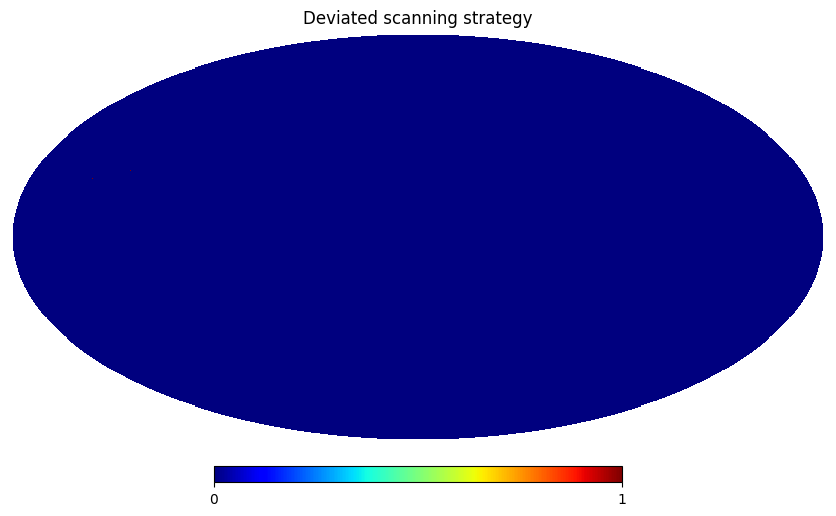

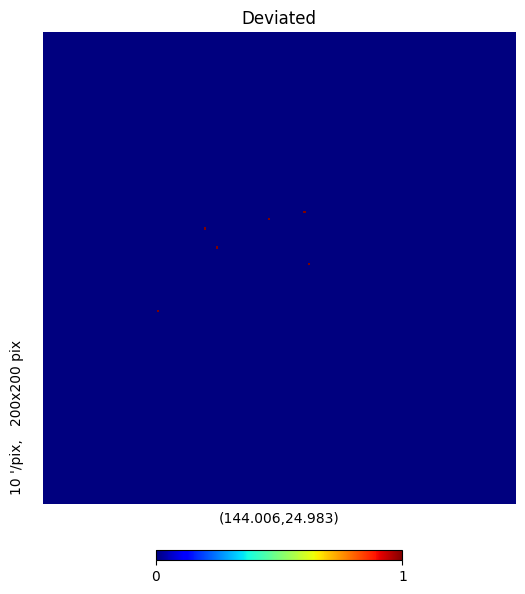

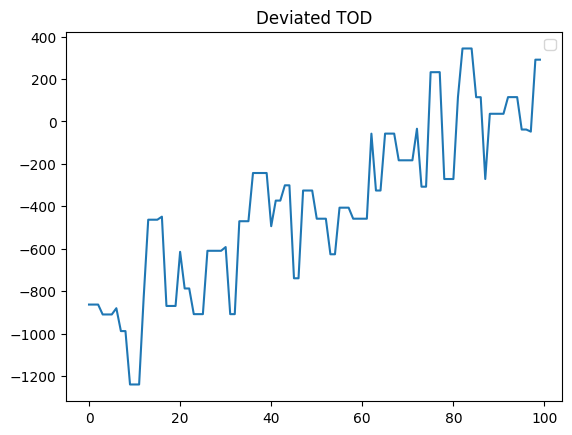

In [ ]:
Ntest = 100
Nside = 1024

map_test = hp.ud_grade( true_maps[0, :, 0], Nside)

# Deviated TOD
az_deviated, el_deviated = q_sampling_local.azimuth[:Ntest], q_sampling_local.elevation[:Ntest]

pix = hp.ang2pix(
    Nside,
    az_deviated,
    el_deviated,
    lonlat=True
)

test_deviated = np.zeros(hp.nside2npix(Nside))
test_deviated[pix] = 1

deviated_tod = map_test[pix]

hp.mollview(test_deviated, cmap="jet", title="Deviated scanning strategy")
hp.gnomview(test_deviated, cmap="jet", title="Deviated", rot=(np.mean(az_deviated), np.mean(el_deviated)), reso=10)
plt.figure()
plt.plot(deviated_tod)
plt.title("Deviated TOD")
plt.legend()

In [ ]:
# Shifted TOD
az_shifted, el_shifted = q_sampling_local_rec.azimuth[:Ntest], q_sampling_local_rec.elevation[:Ntest]

pix = hp.ang2pix(
    Nside,
    az_shifted,
    el_shifted,
    lonlat=True
)
map_test = np.ones((1, hp.nside2npix(Nside), 3)) * map_test[None, :, None]
wind_x, wind_y = wind_class.get_wind()
Wind = get_wind_operator((wind_x[:Ntest], wind_y[:Ntest]), N_buffer=1, Npointings=Ntest, Nsub=1, nside=Nside)
shifted_atm_map = Wind(map_test)
print(shifted_atm_map.shape)

tod = map_test[0, :, 0][pix]
shifted_tod=[]
for i in range(Ntest):
    shifted_tod.append(shifted_atm_map[i, :, 0][pix[i]])


plt.figure()
plt.plot(shifted_tod)
plt.title("shifted TOD")
plt.legend()

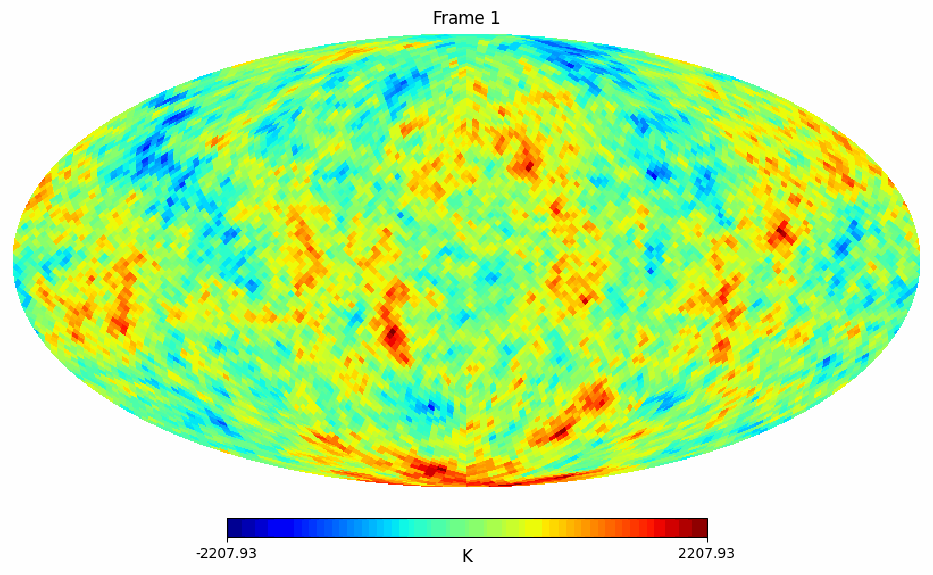

In [ ]:
create_mollview_gif(shifted_atm_map[..., 0])

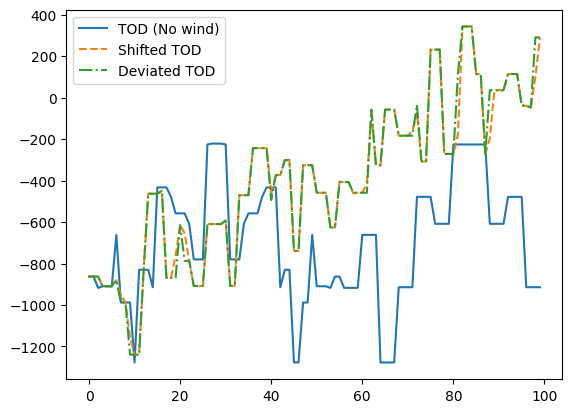

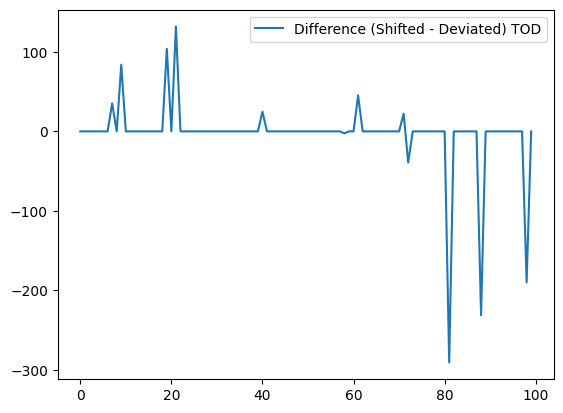

In [ ]:
# Difference
plt.plot(tod, label="TOD (No wind)")
plt.plot(shifted_tod, "--", label="Shifted TOD")
plt.plot(deviated_tod, "-.", label="Deviated TOD")
plt.legend()
plt.figure()
plt.plot(shifted_tod - deviated_tod, label="Difference (Shifted - Deviated) TOD")
plt.legend()

In [ ]:
print(np.mean(shifted_tod - deviated_tod).round(3))
print(np.std(shifted_tod - deviated_tod).round(3))

-3.063
46.312


| Nside      | mean (Shifted - Deviated)   | std (Shifted - Deviated)    |
|:----------:|:---------------------------:| :--------------------------:|
| 32         | 7.036                       | 158.88                      |
| 64         | -4.284                      | 105.676                     |
| 128        | -8.276                      | 78.772                      |
| 256        | -3.295                      | 61.051                      |
| 512        | -3.063                      | 46.312                      |